In [50]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Prefer direct VideoFileClip import to avoid editor-level issues (e.g., MoviePy 1.0.3 + Py3.12)
try:
    from moviepy.video.io.VideoFileClip import VideoFileClip
except Exception:
    try:
        from moviepy.editor import VideoFileClip
    except Exception as e:
        raise ImportError("Could not import MoviePy VideoFileClip; please install/upgrade moviepy") from e

try:
    from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
except Exception:
    ffmpeg_extract_subclip = None


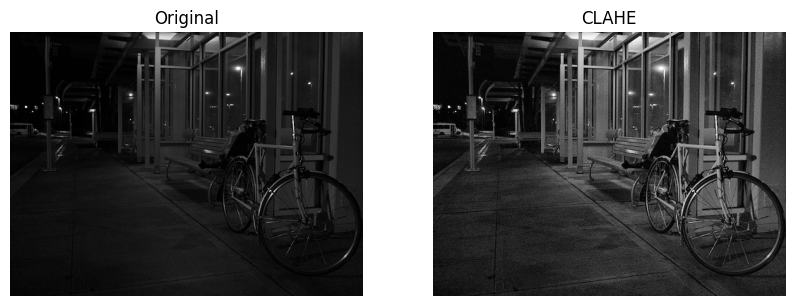

In [51]:
img = cv2.imread("2015_00003.png", cv2.IMREAD_GRAYSCALE)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
out = clahe.apply(img)

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.title("Original")
plt.imshow(img, cmap="gray")
plt.axis("off")

plt.subplot(1,2,2)
plt.title("CLAHE")
plt.imshow(out, cmap="gray")
plt.axis("off")

plt.show()

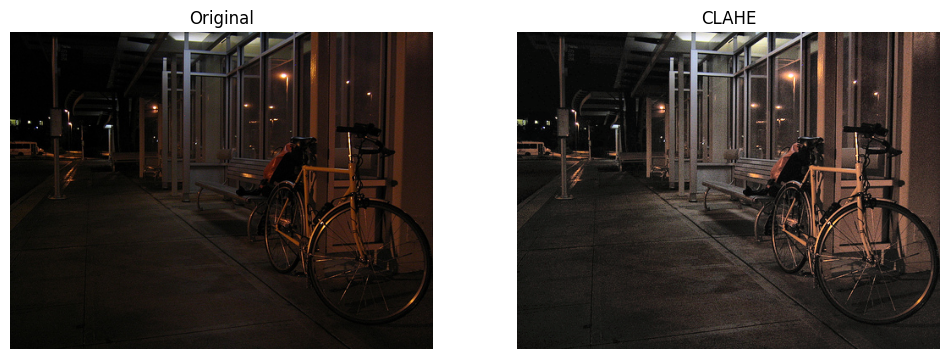

In [52]:
img = cv2.imread("2015_00003.png")

lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
l, a, b = cv2.split(lab)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
l2 = clahe.apply(l)

lab2 = cv2.merge([l2, a, b])
out = cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.title("Original")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(1,2,2)
plt.title("CLAHE")
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.show()

In [53]:
from moviepy.editor import VideoFileClip

# Robust FPS selection: try OpenCV first, then default to 24.
video_path = "Dark Alleys at night in the rain..mp4"
cap = cv2.VideoCapture(video_path)
fps_from_cv = cap.get(cv2.CAP_PROP_FPS)
cap.release()

fps = fps_from_cv if fps_from_cv and not np.isnan(fps_from_cv) else 24.0
fps = float(fps)
print(f"FPS detected: {fps_from_cv}, using: {fps}")

subclip_path = "output.mp4"
used_ffmpeg = False

# Prefer ffmpeg_extract_subclip to avoid MoviePy fps inference issues.
if ffmpeg_extract_subclip is not None:
    try:
        ffmpeg_extract_subclip(video_path, 40, 70, targetname=subclip_path)
        used_ffmpeg = True
        print("Used ffmpeg_extract_subclip for trimming.")
    except Exception as e:
        print(f"ffmpeg_extract_subclip failed: {e}; falling back to MoviePy.")

if not used_ffmpeg:
    clip = VideoFileClip(video_path, fps_source="tbr")
    clip = clip.set_fps(fps)
    clip.fps = fps
    trimmed = clip.subclip(40, 70)
    trimmed = trimmed.set_fps(fps)
    trimmed.fps = fps
    print(f"trimmed.fps before write: {trimmed.fps} ({type(trimmed.fps)})")
    trimmed.write_videofile(subclip_path, codec="libx264", audio_codec="aac", fps=fps)
    trimmed.close()
    clip.close()

# Write GIF from the trimmed file with a safe FPS.
gif_clip = VideoFileClip(subclip_path)
gif_clip = gif_clip.set_fps(fps)
gif_clip.fps = fps
gif_clip.write_gif("output.gif", fps=min(fps, 12))
gif_clip.close()


FPS detected: 24.0, using: 24.0
Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful
Used ffmpeg_extract_subclip for trimming.
MoviePy - Building file output.gif with imageio.


In [ ]:
# For each frame in output.mp4 apply CLAHE

cap = cv2.VideoCapture("output.mp4")
fps = cap.get(cv2.CAP_PROP_FPS)
if fps is None or fps <= 1 or np.isnan(fps):
    fps = 24.0
print(f"Video FPS for CLAHE pass: {fps}")

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
w   = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h   = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(f"Resolution: {w}x{h}")

out = cv2.VideoWriter("clahe_output.mp4", fourcc, fps, (w, h))

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

frame_count = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break
    frame_count += 1
    
    # Convert to LAB
    lab = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    # Apply CLAHE on L channel
    l2 = clahe.apply(l)

    # Re-merge and convert back
    lab2 = cv2.merge([l2, a, b])
    enhanced = cv2.cvtColor(lab2, cv2.COLOR_LAB2BGR)

    out.write(enhanced)

cap.release()
out.release()
print(f"Done. Frames processed: {frame_count}")


Done.


In [49]:
from IPython.display import Video

video_path = 'clahe_output.mp4'

display(Video(video_path, embed=True))